In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!mkdir ~/.kaggle
!cp /content/drive/MyDrive/kaggle.json ~/.kaggle/kaggle.json
!kaggle datasets download -d balraj98/massachusetts-roads-dataset
!unzip -u /content/massachusetts-roads-dataset

In [ ]:
#!unzip /content/drive/MyDrive/data1.zip Я загружаю уже предобработанные(что в происходит в RoadsDataModule.prepare_data()) картинки. Так быстрее получаетс, а времени у меня в colab мало

In [ ]:
!pip install torchmetrics
!pip install pytorch-lightning
!pip install split-image
!pip install segmentation-models-pytorch
!pip install tbparse

In [66]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import albumentations as A
from albumentations.pytorch import ToTensorV2

from PIL import Image
from pathlib import Path

import torchvision.transforms.functional as TF
import time
import os
import copy

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data.sampler import SubsetRandomSampler
from torch.optim.lr_scheduler import StepLR, ReduceLROnPlateau, CosineAnnealingLR

from torchmetrics.classification import BinaryJaccardIndex
import segmentation_models_pytorch as smp
import pytorch_lightning as pl

from split_image import split_image

from tbparse import SummaryReader

In [5]:
train_images_path = Path('/content/data/tiff/train')
train_labels_path = Path('/content/data/tiff/train_labels')
val_images_path = Path('/content/data/tiff/val')
val_labels_path = Path('/content/data/tiff/val_labels')
test_images_path = Path('/content/data/tiff/test')
test_labels_path = Path('/content/data/tiff/test_labels')

In [6]:
train_paths = {'images': train_images_path , 'masks': train_labels_path }
val_paths = {'images': val_images_path , 'masks': val_labels_path }
test_paths = {'images': test_images_path , 'masks': test_labels_path }

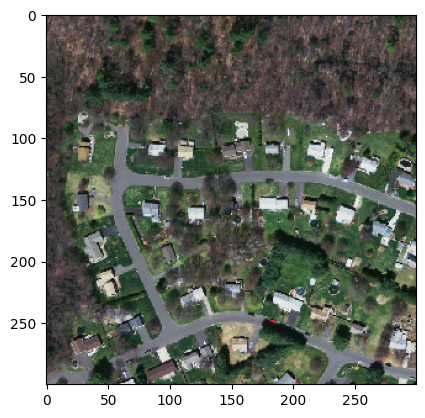

In [7]:
my_image_path = train_images_path / "10078660_15_1.tiff"
my_image = Image.open(my_image_path)
plt.imshow(my_image)
plt.show()

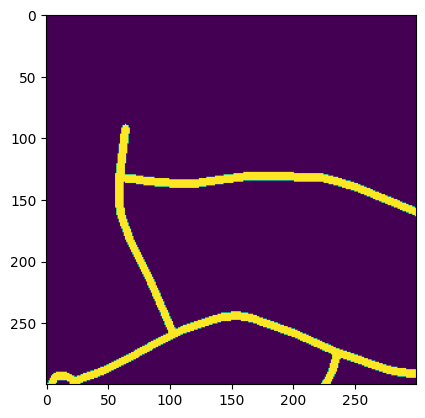

In [8]:
my_mask_path = train_labels_path / "10078660_15_1.tif"
my_mask = Image.open(my_mask_path)
plt.imshow(my_mask)
plt.show()

In [9]:
print(my_image.height, my_image.width)

300 300


In [17]:
#hyperparameters
INPUT_SIZE = (288, 288)
NUM_WORKERS = 2
BATCH_SIZE = 32

In [18]:
def split(data_dir):
    image_dir = data_dir['images']
    mask_dir = data_dir['masks']
    image_paths = image_dir.rglob("*.tif*")
    image_paths = sorted([path for path in image_paths])
    mask_paths = mask_dir.rglob("*.tif*")
    mask_paths = sorted([path for path in mask_paths])
    for image in image_paths:
        split_image(image_path=image, rows=5, cols=5, should_square=False, should_cleanup=True, should_quiet=True, output_dir=str(image_dir))
    for mask in mask_paths:
        split_image(image_path=mask, rows=5, cols=5, should_square=False, should_cleanup=True, should_quiet=True, output_dir=str(mask_dir))


def cleanup(data_dir):
    image_dir = data_dir['images']
    mask_dir = data_dir['masks']
    image_paths = image_dir.rglob("*.tif*")
    image_paths = sorted([path for path in image_paths])
    for image in image_paths:
        my_image_array = np.array(Image.open(image))
        if np.count_nonzero(my_image_array==[255, 255, 255])/my_image_array.size > 0.01:
            image.unlink()
            Path(mask_dir / image.name[:-1]).unlink()

In [19]:
class RoadsDataset(Dataset):

    def __init__(self, data_dir, transform=None):
        self.image_dir = data_dir['images']
        self.mask_dir = data_dir['masks']
        self.transform = transform
        self.image_paths = self.image_dir.rglob("*.tif*")
        self.image_paths = sorted([path for path in self.image_paths])
        self.mask_paths = self.mask_dir.rglob("*.tif*")
        self.mask_paths = sorted([path for path in self.mask_paths])


    def __len__(self):
        return len(self.image_paths)


    def __getitem__(self, index):
        img_path = self.image_paths[index]
        mask_path = self.mask_paths[index]
        image = np.array(Image.open(img_path).convert("RGB"))
        mask = np.array(Image.open(mask_path).convert("L"), dtype=np.float32)
        mask[mask == 255.0] = 1.0

        if self.transform is not None:
            augmentations = self.transform(image=image, mask=mask)
            image = augmentations["image"]
            mask = augmentations["mask"]

        return image, mask

In [20]:
class RoadsDataModule(pl.LightningDataModule):

    def __init__(self, train_paths, val_paths, test_paths, batch_size, num_workers, input_size):
        super().__init__()
        self.train_paths = train_paths
        self.val_paths = val_paths
        self.test_paths = test_paths
        self.batch_size = batch_size
        self.num_workers = num_workers
        self.input_size = input_size
        self.train_transform = A.Compose(
            [
                A.Resize(height=self.input_size[0], width=self.input_size[1]),
                A.RandomRotate90(p=0.5),
                A.HorizontalFlip(p=0.5),
                A.VerticalFlip(p=0.1),
                A.Transpose(p=0.5),
                A.RandomBrightnessContrast(),
                A.Normalize(),
                ToTensorV2(),

            ],
        )

        self.val_transform = A.Compose(
            [
                A.Resize(height=self.input_size[0], width=self.input_size[1]),
                A.Normalize(),
                ToTensorV2(),

            ],
        )


    def prepare_data(self):
        split(train_paths)
        split(val_paths)
        split(test_paths)
        cleanup(train_paths)


    def setup(self, stage):

        self.train_ds = RoadsDataset(
            data_dir=self.train_paths,
            transform=self.train_transform,
        )

        self.val_ds = RoadsDataset(
            data_dir=self.val_paths,
            transform=self.val_transform,

        )

        self.test_ds = RoadsDataset(
            data_dir=self.test_paths,
            transform=self.val_transform,

        )

    def train_dataloader(self):
        return DataLoader(
            self.train_ds,
            batch_size=self.batch_size,
            num_workers=self.num_workers,
            pin_memory=True,
            shuffle=True,
        )

    def val_dataloader(self):
        return DataLoader(
            self.val_ds,
            batch_size=self.batch_size,
            num_workers=self.num_workers,
            pin_memory=True,
            shuffle=False,
        )

    def test_dataloader(self):
        return DataLoader(
            self.test_ds,
            batch_size=self.batch_size,
            num_workers=self.num_workers,
            pin_memory=True,
            shuffle=False,
        )

In [21]:
def imshow(image, mask, title=None, default=False):
    """Imshow for tensors"""
    image = image.numpy().transpose((1, 2, 0))
    mean = (0.485, 0.456, 0.406)
    std = (0.229, 0.224, 0.225)
    image = std * image + mean
    image = np.clip(image, 0, 1)
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
    ax1.imshow(image)
    ax2.imshow(mask, cmap='gray')
    ax3.imshow(image)
    ax3.imshow(mask, alpha=0.5, cmap='gray')

In [22]:
data_module = RoadsDataModule(train_paths, val_paths, test_paths, BATCH_SIZE, NUM_WORKERS, INPUT_SIZE)
data_module.setup('train')

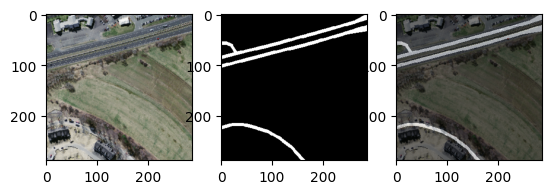

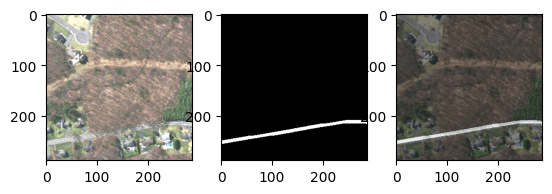

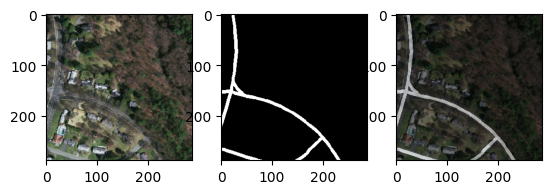

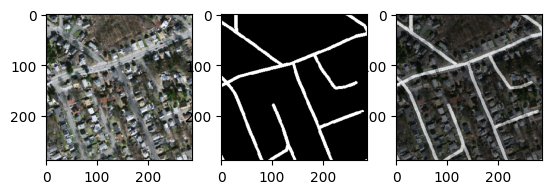

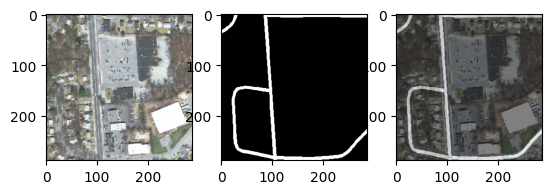

In [23]:
train_loader = data_module.train_dataloader()
images, masks = next(iter(train_loader))
for i in range(5):
    imshow(images[i], masks[i])

In [49]:
model = smp.UnetPlusPlus(
    encoder_name="efficientnet-b2",        # choose encoder, e.g. mobilenet_v2 or efficientnet-b7
    encoder_weights="imagenet",     # use `imagenet` pre-trained weights for encoder initialization
    in_channels=3,                  # model input channels (1 for gray-scale images, 3 for RGB, etc.)
    classes=1,
    # model output channels (number of classes in your dataset)
)

In [50]:
class NN(pl.LightningModule):
    def __init__(self, model, learning_rate=1e-3, weight_decay=1e-2):
        super().__init__()
        self.model = model
        self.learning_rate = learning_rate
        self.weight_decay = weight_decay
        self.sigmoid = nn.Sigmoid()
        self.loss_fn = smp.losses.DiceLoss(mode='binary')
        #self.loss_fn = nn.BCEWithLogitsLoss()
        self.iou = BinaryJaccardIndex()

    def forward(self, x):
        return model(x)

    def training_step(self, batch, batch_idx):
        loss, scores, y = self._common_step(batch, batch_idx)
        iou = self.iou(scores, y)
        self.log_dict({'train_loss': loss, 'train_iou': iou},
                      on_step=False, on_epoch=True, prog_bar=True)
        return {'loss': loss, "scores": scores, "y": y}

    def validation_step(self, batch, batch_idx):
        loss, scores, y = self._common_step(batch, batch_idx)
        iou = self.iou(scores, y)
        self.log_dict({'val_loss': loss, 'val_iou': iou},
                      on_step=False, on_epoch=True, prog_bar=True)
        return {'loss': loss, "scores": scores, "y": y}

    def test_step(self, batch, batch_idx):
        loss, scores, y = self._common_step(batch, batch_idx)
        iou = self.iou(scores, y)
        '''scores_sigm = self.sigmoid(scores)
        tp, fp, fn, tn = smp.metrics.get_stats(scores_sigm, y.to(torch.int32), mode='binary', threshold=0.5)
        smp_iou = smp.metrics.functional.iou_score(tp, fp, fn, tn, reduction='macro')'''
        self.log_dict({'test_iou': iou},
                      on_step=False, on_epoch=True, prog_bar=True)
        return {'loss': loss, "scores": scores, "y": y}

    def _common_step(self, batch, batch_idx):
        x, y = batch
        scores = self.forward(x)
        scores = scores.squeeze(1)
        loss = self.loss_fn(scores, y)
        scores = self.sigmoid(scores)
        return loss, scores, y

    def predict_step(self, batch, batch_idx):
        x, y = batch
        scores = self.forward(x)
        preds = self.sigmoid(scores)
        return preds

    def configure_optimizers(self):
      optimizer = optim.RAdam(self.parameters(), lr=self.learning_rate, weight_decay=self.weight_decay)
      #scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=4, T_mult=1, eta_min=1e-4, last_epoch=-1)
      scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=2, threshold=1e-3)
      #return [optimizer], [scheduler]
      return {
          'optimizer': optimizer,
          'lr_scheduler' : {
          # REQUIRED: The scheduler instance
          "scheduler": scheduler,
          # The unit of the scheduler's step size, could also be 'step'.
          # 'epoch' updates the scheduler on epoch end whereas 'step'
          # updates it after a optimizer update.
          "interval": "epoch",
          # How many epochs/steps should pass between calls to
          # `scheduler.step()`. 1 corresponds to updating the learning
          # rate after every epoch/step.
          "frequency": 1,
          # Metric to to monitor for schedulers like `ReduceLROnPlateau`
          "monitor": "val_iou",
          # If set to `True`, will enforce that the value specified 'monitor'
          # is available when the scheduler is updated, thus stopping
          # training if not found. If set to `False`, it will only produce a warning
          "strict": True,
          # If using the `LearningRateMonitor` callback to monitor the
          # learning rate progress, this keyword can be used to specify
          # a custom logged name
          "name": None,
          }
      }

In [51]:
seg = NN(
    model=model,
    learning_rate=1e-3,
    weight_decay=1e-4,
)

In [52]:
from pytorch_lightning.callbacks import ModelCheckpoint
checkpoint_callback = ModelCheckpoint(monitor='val_iou', save_top_k=1, mode='max')

In [53]:
trainer = pl.Trainer(accelerator='gpu', max_epochs=16, precision='16-mixed', callbacks=[checkpoint_callback])

INFO:pytorch_lightning.utilities.rank_zero:Using 16bit Automatic Mixed Precision (AMP)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [54]:
%reload_ext tensorboard

In [55]:
%tensorboard --logdir '/content/lightning_logs'

Reusing TensorBoard on port 6006 (pid 18193), started 0:00:30 ago. (Use '!kill 18193' to kill it.)

<IPython.core.display.Javascript object>

In [56]:
trainer.fit(seg, data_module)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type               | Params
-----------------------------------------------
0 | model   | UnetPlusPlus       | 10.4 M
1 | sigmoid | Sigmoid            | 0     
2 | loss_fn | DiceLoss           | 0     
3 | iou     | BinaryJaccardIndex | 0     
-----------------------------------------------
10.4 M    Trainable params
0         Non-trainable params
10.4 M    Total params
41.605    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=16` reached.


In [68]:
reader = SummaryReader("/content/lightning_logs/version_2")
logs = reader.scalars
training_loss = logs.loc[logs['tag']=='train_loss']
validation_iou = logs.loc[logs['tag']=='val_iou']
logs.tail()

,step,tag,value
93,8519,val_loss,0.244875
94,9229,val_loss,0.245881
95,9939,val_loss,0.241574
96,10649,val_loss,0.245326
97,11359,val_loss,0.241999


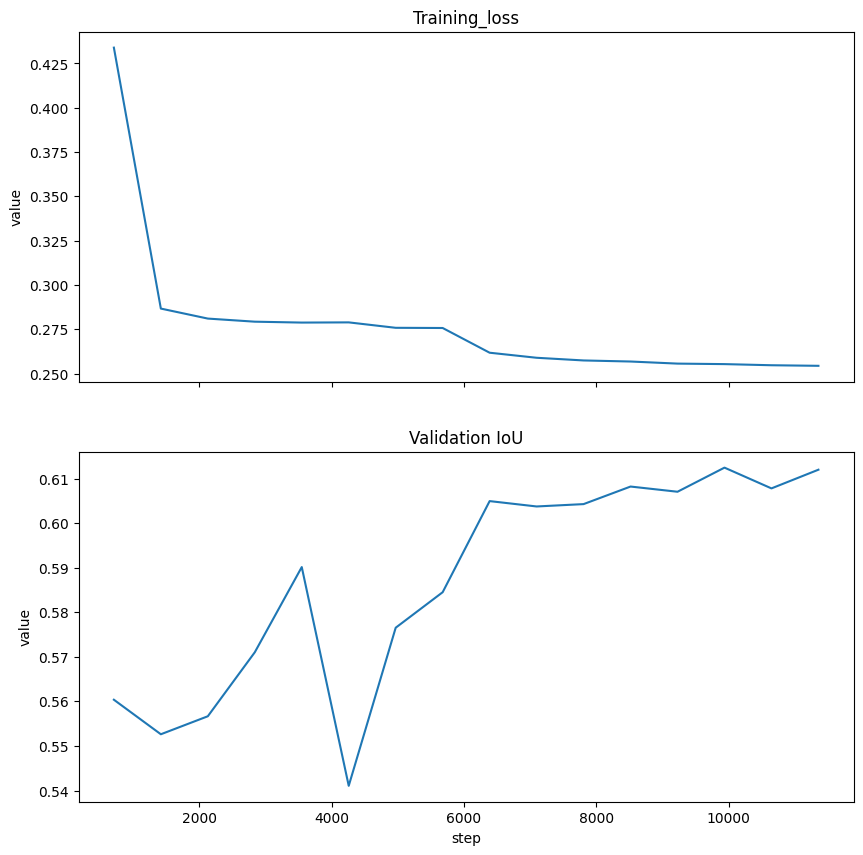

In [71]:
fig, axs = plt.subplots(2, 1, figsize=(10,10), sharex=True)
sns.lineplot(data=training_loss, x='step', y='value', ax=axs[0]).set_title("Training_loss")
sns.lineplot(data=validation_iou, x='step', y='value', ax=axs[1]).set_title("Validation IoU")
plt.show()

In [61]:
seg = NN.load_from_checkpoint(
    '/content/lightning_logs/version_2/checkpoints/epoch=13-step=9940.ckpt',
    model=model,
    learning_rate=1e-3,
    weight_decay=1e-4,
)

In [62]:
trainer.test(seg, data_module)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_iou          │    0.6351197957992554     │
└───────────────────────────┴───────────────────────────┘

[{'test_iou': 0.6351197957992554}]

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

<ipython-input-21-9cb82b59aef9>:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax1, ax2, ax3) = plt.subplots(1, 3)


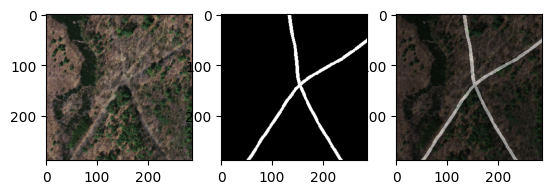

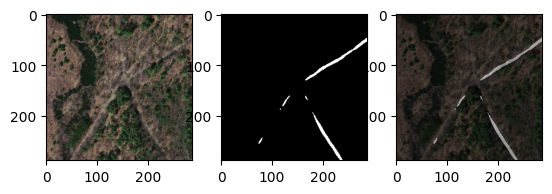

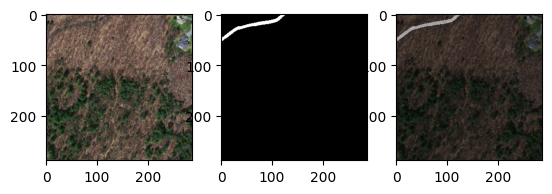

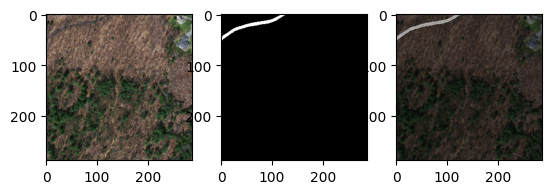

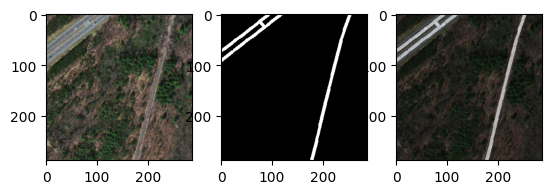

...

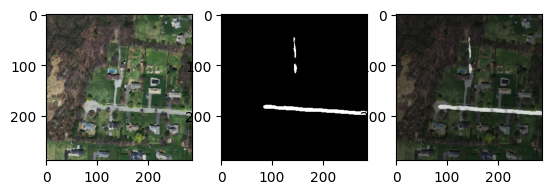

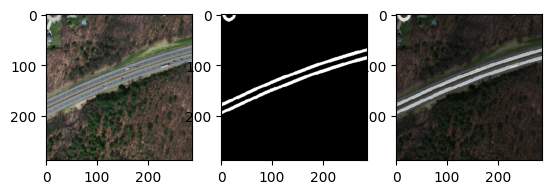

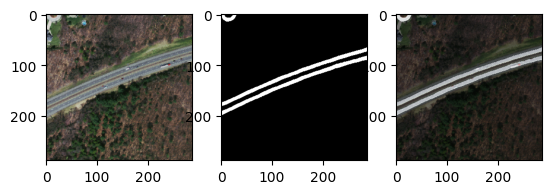

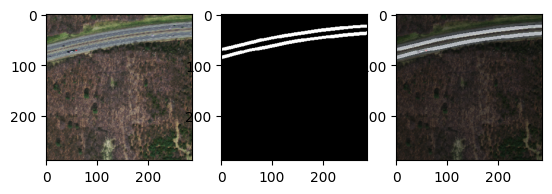

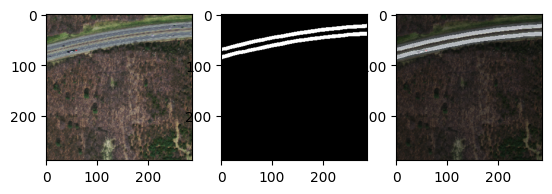

In [64]:
test_loader = data_module.test_dataloader()

images, masks = next(iter(test_loader))
images, masks = images, masks.unsqueeze(1)
preds = trainer.predict(seg, test_loader)
outs = preds[0]
outs = (outs > 0.5).to(torch.float32)
for i in range(10):
    imshow(images[i].detach(), masks[i].detach().squeeze())
    imshow(images[i].detach(), outs[i].detach().squeeze())
